# USER INPUT PARAMETERS

In [1]:
# File path to the template signal
fname = "test.wav"

In [2]:
# File path to the collected signal
# If file name is "", timing analysis is done between test.wav and itself
fname1 = "N6GN_20211115T190749_iq_15.wav"

In [3]:
# Do you want a custom sample rate as supposed to the value given by the wav files themselves?
# Leave fs_custom = -1 if the answer is NO
fs_custom = -1

# Import Useful Libraries

In [4]:
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.transforms as transforms

from scipy import signal
from scipy.io import wavfile

from IPython.display import Audio, display

%matplotlib inline

In [5]:
# Matplotlib settings to make the plots look a little nicer.

plt.rcParams['font.size']      = 18
plt.rcParams['font.weight']    = 'bold'
plt.rcParams['axes.grid']      = True
plt.rcParams['axes.xmargin']   = 0
plt.rcParams['grid.linestyle'] = ':'
plt.rcParams['figure.figsize'] = (10,6)

# Define Useful Functions

In [6]:
def play(x, fs, autoplay=False):
    display(Audio(x, rate=fs, autoplay=autoplay))

In [7]:
def norm(wav):
    ''' Normalization function '''
    return wav/np.max(np.abs(wav))

In [8]:
def dco(wav):
    ''' Remove DC offset and normalize the signal '''
    return norm(wav - np.mean(wav))

In [9]:
def extract(wav, t1, t2, fs):
    ''' Extract a portion of the input signal from t1 to t2 '''
    cut = wav[math.floor(t1*fs):math.floor(t2*fs)]
    tcut = np.arange(len(cut))*(1./fs)
    return cut, tcut

In [10]:
def plot_signal(time_vec,x_0,xlim=None,title=None):
    ''' Plot the signal in the time doman'''
    
    fig = plt.figure(figsize=(15,12))

    ax = fig.add_subplot(2,1,1)
    ax.plot(time_vec,x_0)
    ax.set_xticklabels([])
    ax.set_ylabel('x(t)')
    ax.set_xlim(xlim)
    ax.set_title(title)

    ax = fig.add_subplot(2,1,2)
    samplerate = 1./(time_vec[1]-time_vec[0])
    ax.specgram(x_0,Fs=samplerate)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Hz')
    ax.set_xlim(xlim)
    #ax.set_ylim(0,5000)

    fig.tight_layout()
    plt.show()
    plt.close(fig)

In [11]:
def plot_correlation(tau, Rxy, title = None):
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(1,1,1)
    ax.plot(tau, Rxy)
    ax.set_xlabel('Tau [s]')
    ax.set_ylabel('$R_{XY}$')
    ax.set_title(title)
    
    plt.show()
    plt.close(fig)

In [12]:
def plot_frequency_response(Wn, b, a, fs, title=None):
    w, h = signal.freqz(b, a)

    f = (fs/2)*(w/(np.pi))
    
    fig = plt.figure(figsize=(15,12))

    ax = fig.add_subplot(2,1,1)
    ax.plot(f, 20 * np.log10(abs(h)))
    ax.set_xscale('log')
    ax.set_title(title)
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('Amplitude [dB]')  
    ax.grid(which='both', axis='both')
    if type(Wn) == tuple:
        ax.axvline(Wn[0], color='green') # cutoff frequency
        ax.axvline(Wn[1], color='green') # cutoff frequency
    else:
        ax.axvline(Wn, color='green') # cutoff frequency

    ax = fig.add_subplot(2,1,2)
    ax.plot(f, np.unwrap(np.angle(h)))
    ax.set_xscale('log')
    ax.set_title(title)
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('Phase [rad]')
    ax.grid(which='both', axis='both')
    if type(Wn) == tuple:
        ax.axvline(Wn[0], color='green') # cutoff frequency
        ax.axvline(Wn[1], color='green') # cutoff frequency
    else:
        ax.axvline(Wn, color='green') # cutoff frequency

    plt.tight_layout()
    plt.show()

In [13]:
def get_matching_time(Rxy, fs):
    return np.where(np.abs(Rxy) == np.max(np.abs(Rxy)) )[0][0] * (1./fs)

In [14]:
def find(template, signal, fs, graph=True):
    Rxy = np.correlate(signal, template, mode='same')
    curr_correlation = np.max(np.abs(Rxy))

    max_correlation = 0
    match_time = len(signal) * 1./fs
    while curr_correlation > max_correlation*0.8:
        temp = get_matching_time(Rxy, fs)
        if temp < match_time:
            if graph:
                plot_correlation(np.arange(len(Rxy))*(1./fs), Rxy, title='Cross-Correlation between the Template and the Signal from Start to {:2f} Seconds'.format(match_time))
            max_correlation = curr_correlation
            match_time = temp
            #print(match_time)
        else:
            break

        Rxy = np.correlate(extract(signal,0,match_time-4,fs)[0], template, mode='same')
        curr_correlation = np.max(np.abs(Rxy))
    
    return match_time

# Load manufactured signal

In [15]:
# Load in the file and detect the sampling frequency
fs_wav0, wav0 = wavfile.read(fname)

# Create a time vector
t_wav0 = np.arange(len(wav0)) * (1./fs_wav0)

In [16]:
# Using the sounddevice library, we can hear what the sinusoid sounds like if played as
play(wav0, fs_wav0)

In [17]:
# Normalize the data
wav0_n = norm(wav0)
wav0_n

array([-0.00354015, -0.00399792, -0.00436415, ...,  0.        ,
        0.        ,  0.        ])

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


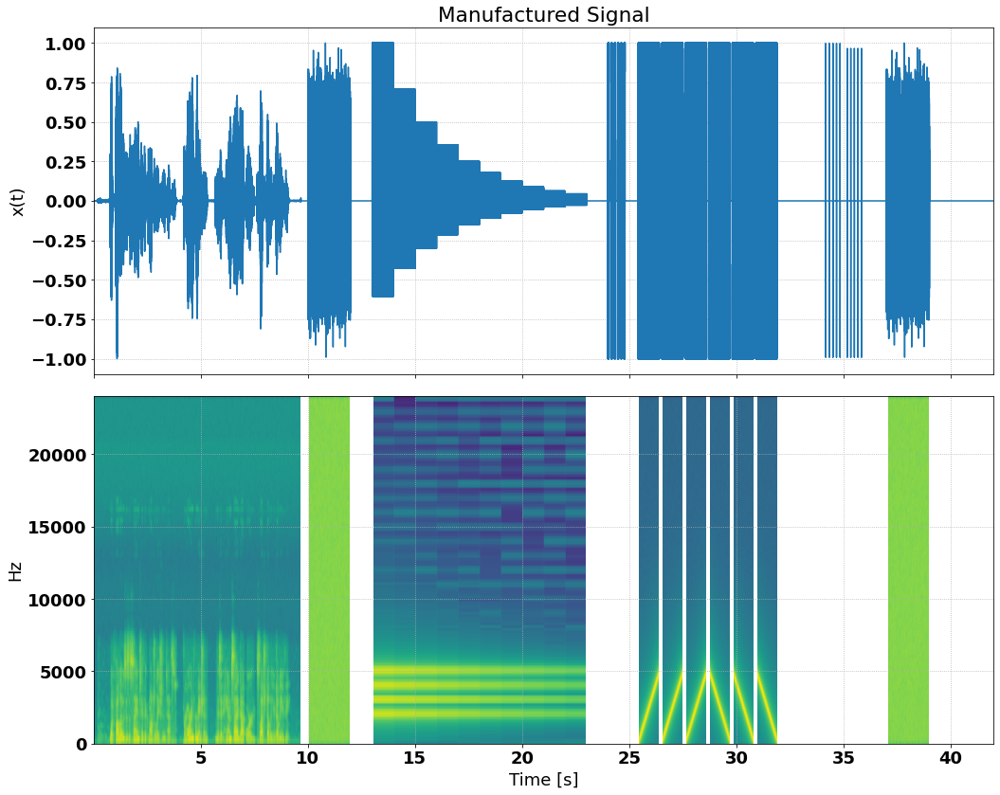

In [18]:
plot_signal(t_wav0, wav0_n, title="Manufactured Signal")

# Extract white nosie

In [19]:
# Extract the white noise
white_noise, t_white_noise = extract(wav0_n, 10, 12, fs_wav0)

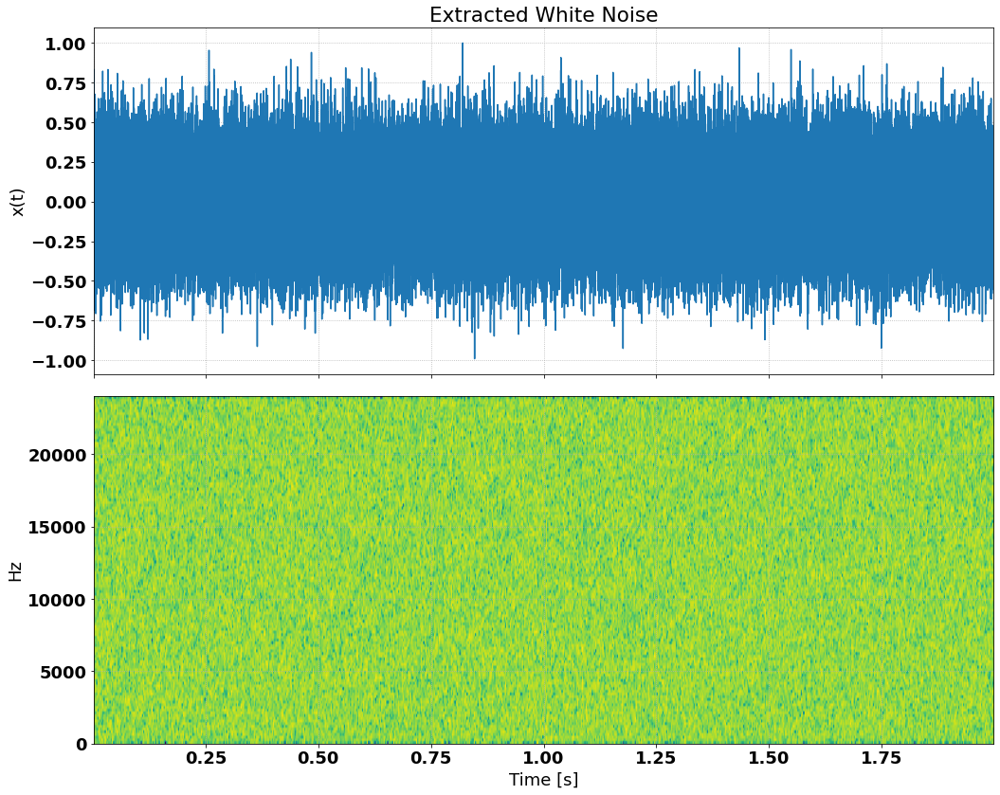

In [20]:
plot_signal(t_white_noise, white_noise, title="Extracted White Noise")

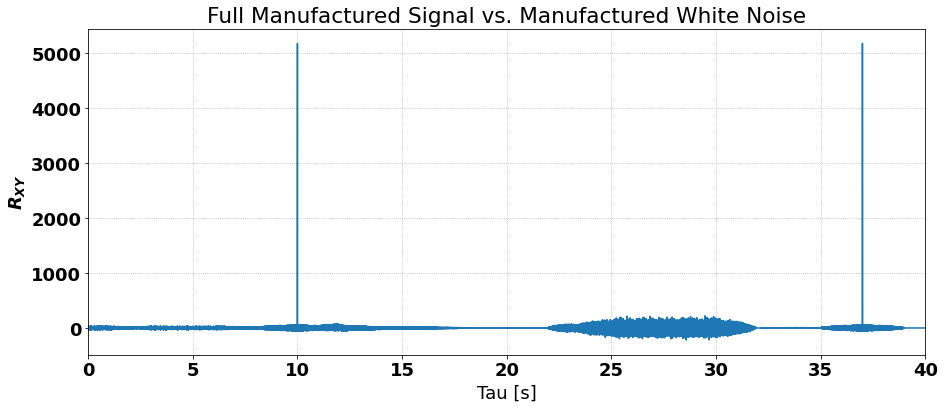

In [21]:
R_test_white = np.correlate(wav0_n, white_noise)

t_test_white = np.arange(len(R_test_white))*(1./fs_wav0)

plot_correlation(t_test_white, R_test_white, title='Full Manufactured Signal vs. Manufactured White Noise')

# Extract Chirps

In [22]:
chirps, t_chirps = extract(wav0_n, 24, 32, fs_wav0)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


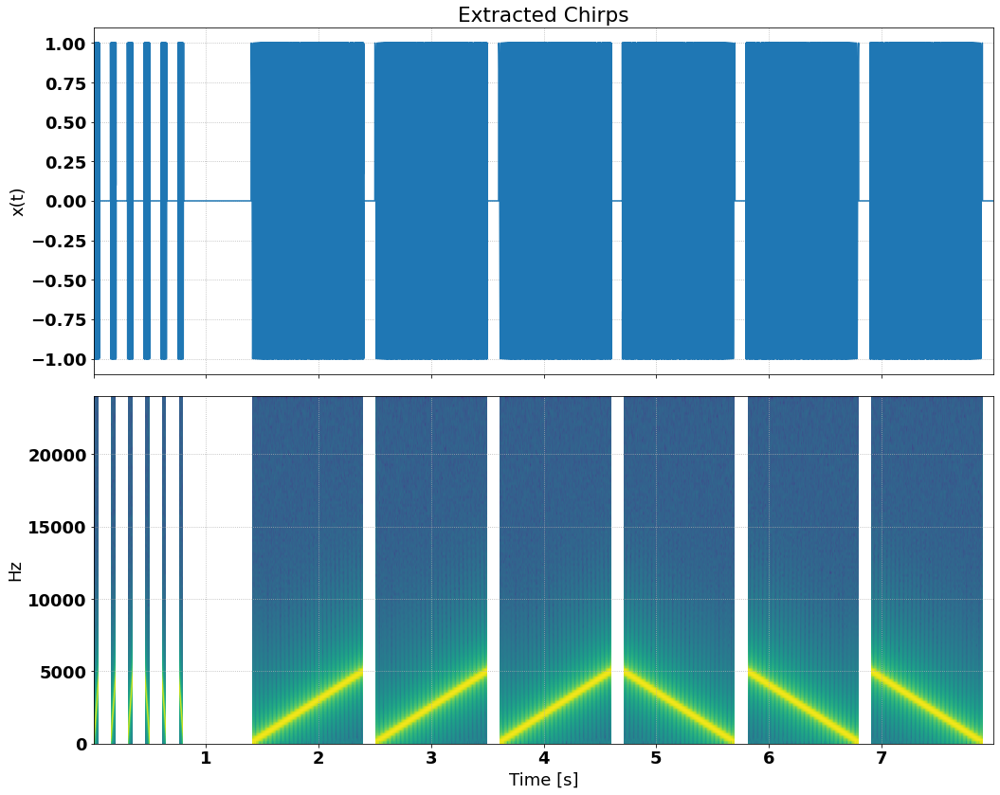

In [23]:
plot_signal(t_chirps, chirps, title="Extracted Chirps")

In [24]:
R_test_chirps = np.correlate(wav0_n, chirps)

t_test_chirps = np.arange(len(R_test_chirps))*(1./fs_wav0)

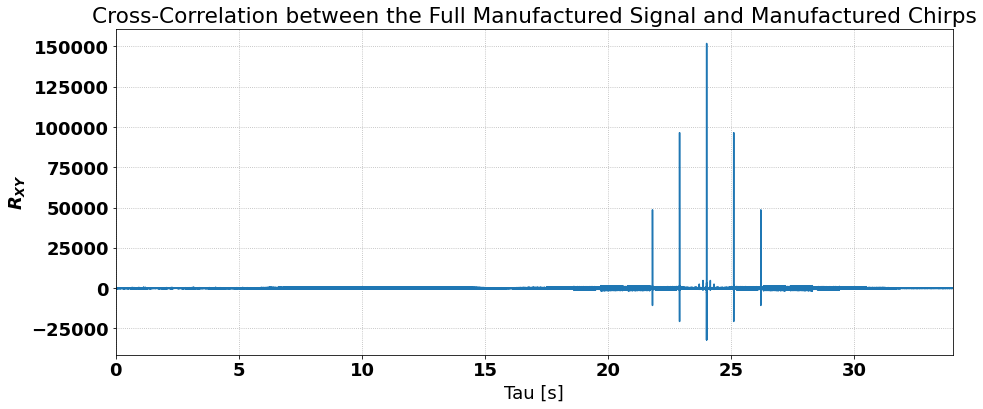

In [25]:
plot_correlation(t_test_chirps, R_test_chirps, title='Cross-Correlation between the Full Manufactured Signal and Manufactured Chirps')

# Load the IQ Data and Perform AM Demodulation

In [26]:
# Note that IQ WAV files look like regular stereo WAV files, but instead of 
# the channels representing the left and right speakers, they represent the
# I and Q signals.

if fname1 != "":
    fs_wav1, iq = wavfile.read(fname1)
    t_wav1      = np.arange(len(iq))*(1./fs_wav1)

    if fs_custom != -1:
        fs_wav1 = fs_custom

    print('Sample Rate: {!s} samples/sec'.format(fs_wav1))
    print('Number of Channels: {!s}'.format(iq.shape[1]))
    print('Data Type: {!s}'.format(iq.dtype))

    iq_float = iq / (np.max(np.abs(iq))+1.0) 

    # AM demodulation.
    wav1 = np.sqrt(iq_float[:,0]**2 + iq_float[:,1]**2)

    play(wav1, fs_wav1)
else:
    fs_wav1 = fs_wav0
    wav1    = wav0
    t_wav1  = t_wav0

Sample Rate: 20249 samples/sec
Number of Channels: 2
Data Type: float32


In [27]:
# Normalize the data
wav1_n = norm(wav1)

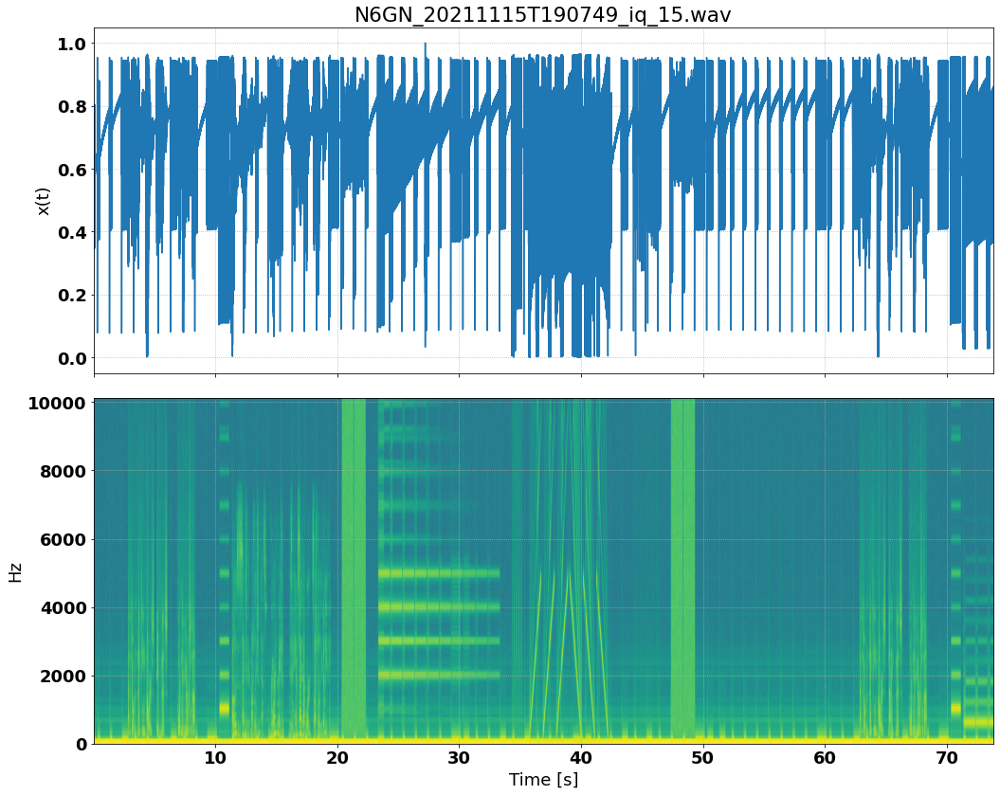

In [28]:
plot_signal(t_wav1, wav1_n, title=fname1)

# Remove the DC Offset

In [29]:
wav1_offset = dco(wav1)

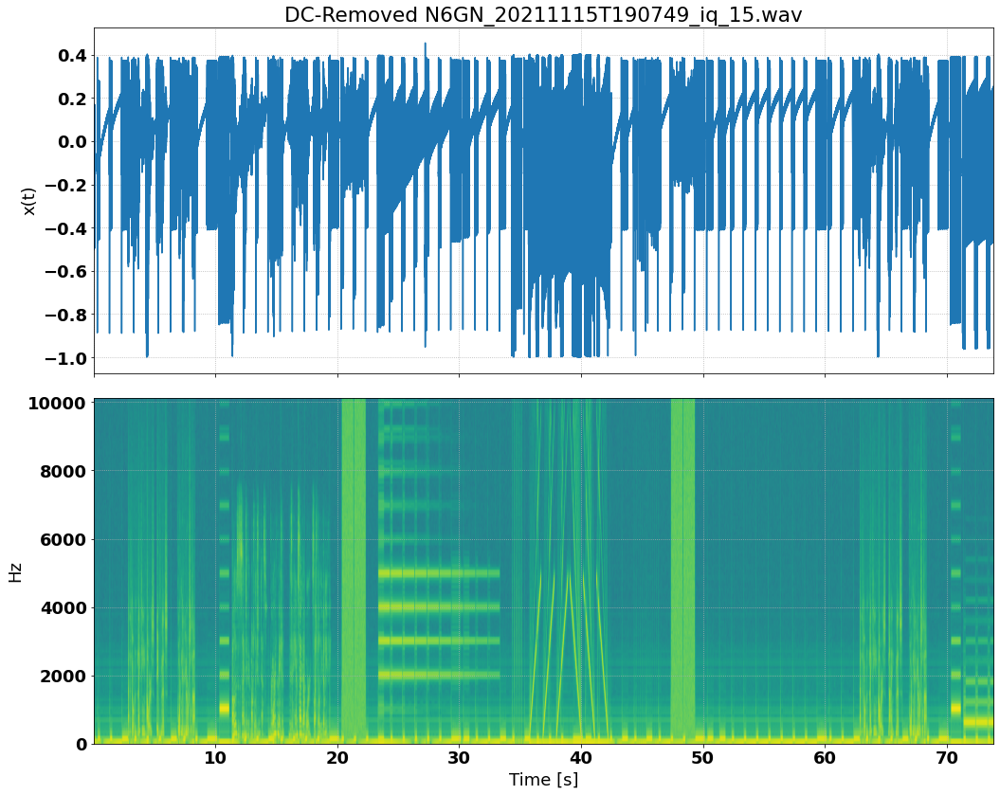

In [30]:
plot_signal(t_wav1, wav1_offset, title='DC-Removed '+fname1)

# Timing of the First White Gaussian Noise

## Filter the Collected Signal

In [31]:
Wn_noise    = math.floor(fs_wav1*0.99/2)   # 3 dB Cutoff Frequency in Hz
btype_noise = 'high'  # Choose 'low' or 'high'

b_noise, a_noise = signal.butter(6, Wn_noise, btype_noise, fs=fs_wav1)

In [32]:
fs_wav1

20249

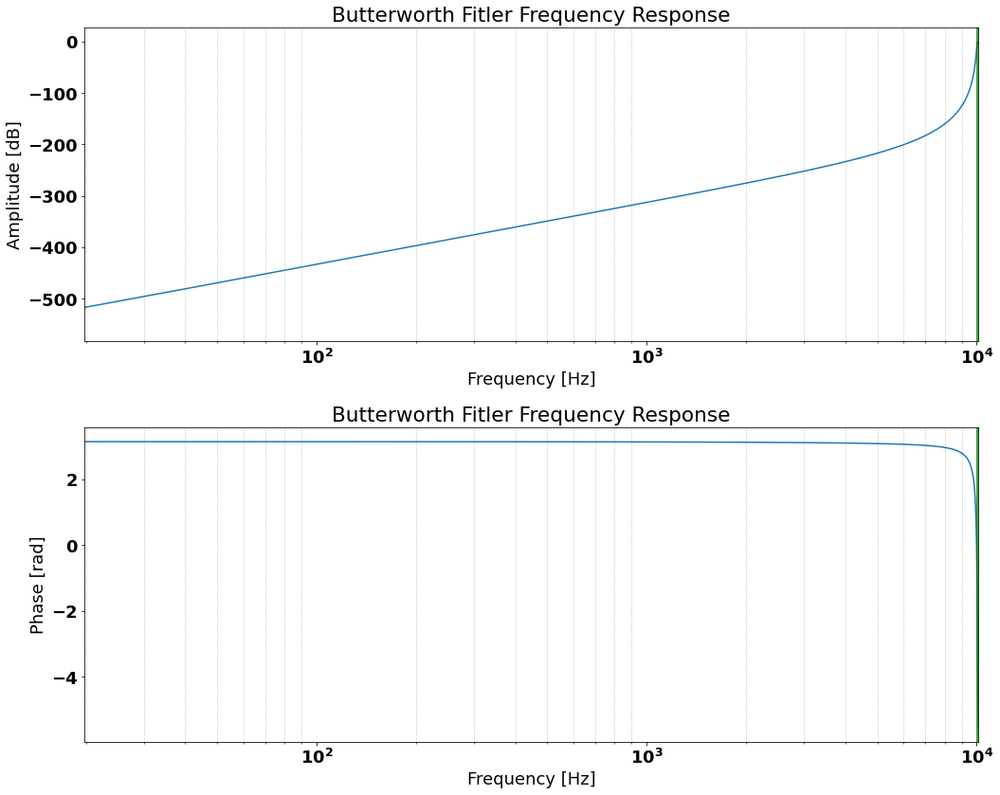

In [33]:
plot_frequency_response(Wn_noise, b_noise, a_noise, fs_wav1, title='Butterworth Fitler Frequency Response')

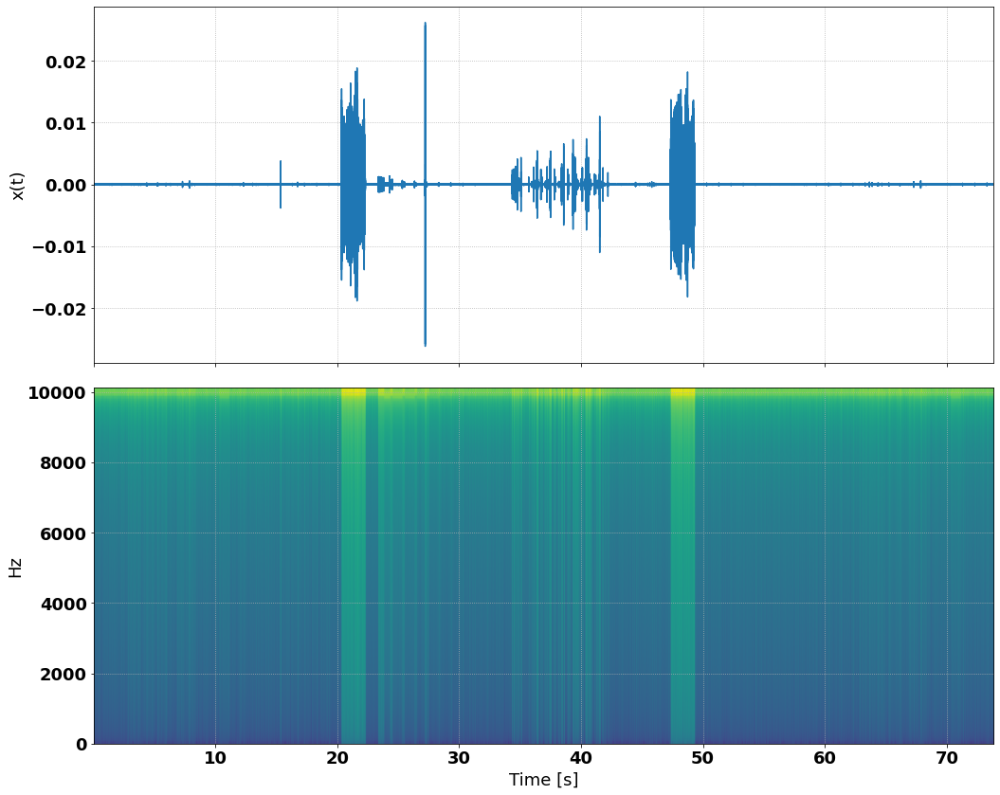

In [34]:
wav1_filt_noise = signal.filtfilt(b_noise, a_noise, wav1_offset)
plot_signal(t_wav1, wav1_filt_noise)

## Cross-Correlate and Return the Timing

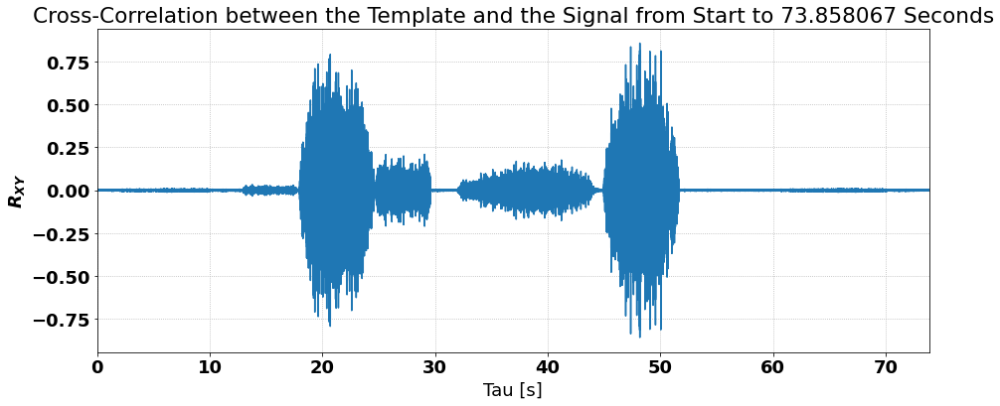

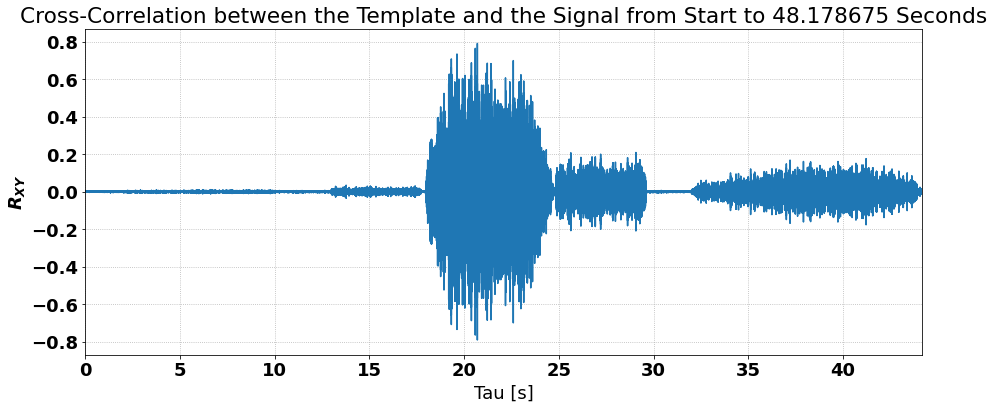

In [35]:
t1 = find(white_noise, wav1_filt_noise, fs_wav1)

In [36]:
print("Start time of the first white Gaussian noise: {:f} seconds.".format(t1))

Start time of the first white Gaussian noise: 20.698997 seconds.


# Timing of the Second White Gaussian Noise

In [37]:
# Approximate time elapsed between the start of the first white noise and the end of the chirps in seconds
t_gap = 22

In [38]:
# Length of the collected signal in seconds
t_total = len(wav1)* 1./fs_wav1

In [39]:
# Collected signal extracted without the portion before the end of the chirps (approximately
collected_0, t_collected_0 = extract(wav1_filt_noise, t1+t_gap, t_total, fs_wav1)

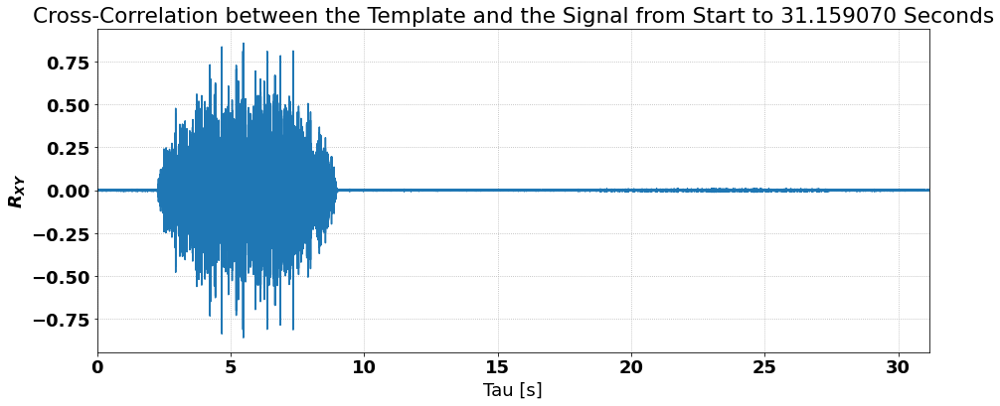

Start time of the second white Gaussian noise with respect to the first white Gaussian noise: 27.479678 seconds.
Start time of the second white Gaussian noise with respect to the beginning of the recording: 48.178675 seconds.


In [40]:
t2 = find(white_noise, collected_0, fs_wav1) + t_gap
print("Start time of the second white Gaussian noise with respect to the first white Gaussian noise: {:f} seconds.".format(t2))
print("Start time of the second white Gaussian noise with respect to the beginning of the recording: {:f} seconds.".format(t2 + t1))

# Timing of the Collected Chirps

## Filter the collected signal

In [41]:
Wn_chirps    = (1000,5000)    # 3 dB Cutoff Frequency in Hz
btype_chirps = 'bandpass'  # Choose 'low' or 'high'

b_chirps, a_chirps = signal.butter(7, Wn_chirps, btype_chirps, fs=fs_wav1)

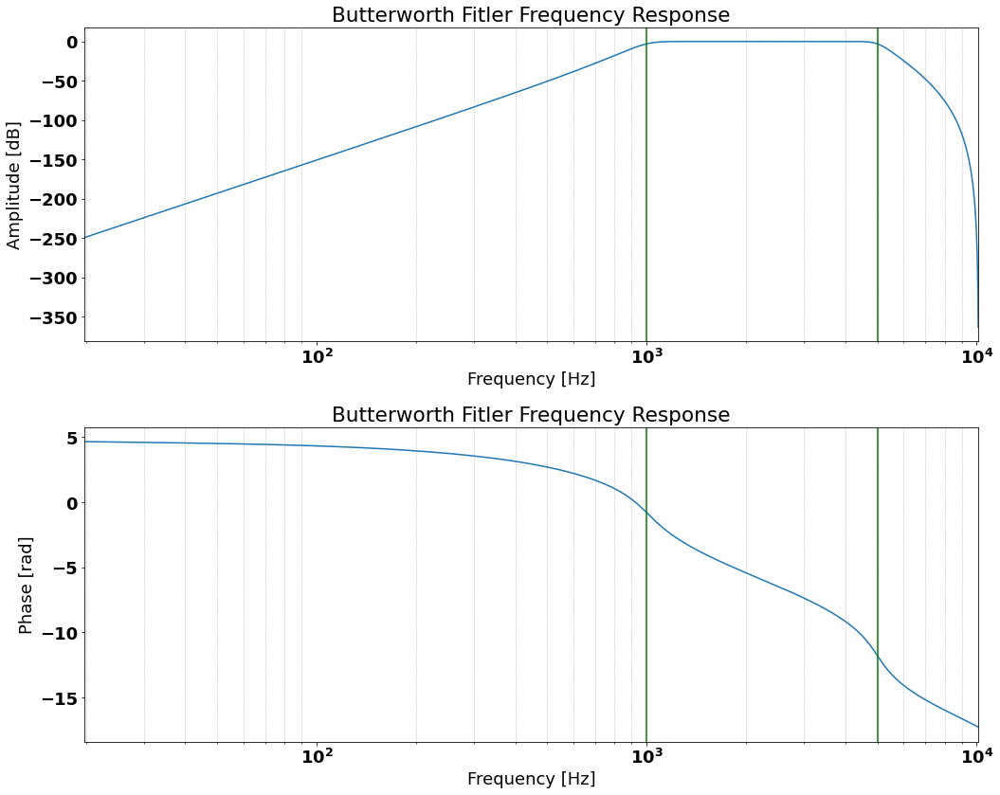

In [42]:
plot_frequency_response(Wn_chirps, b_chirps, a_chirps, fs_wav1, title='Butterworth Fitler Frequency Response')

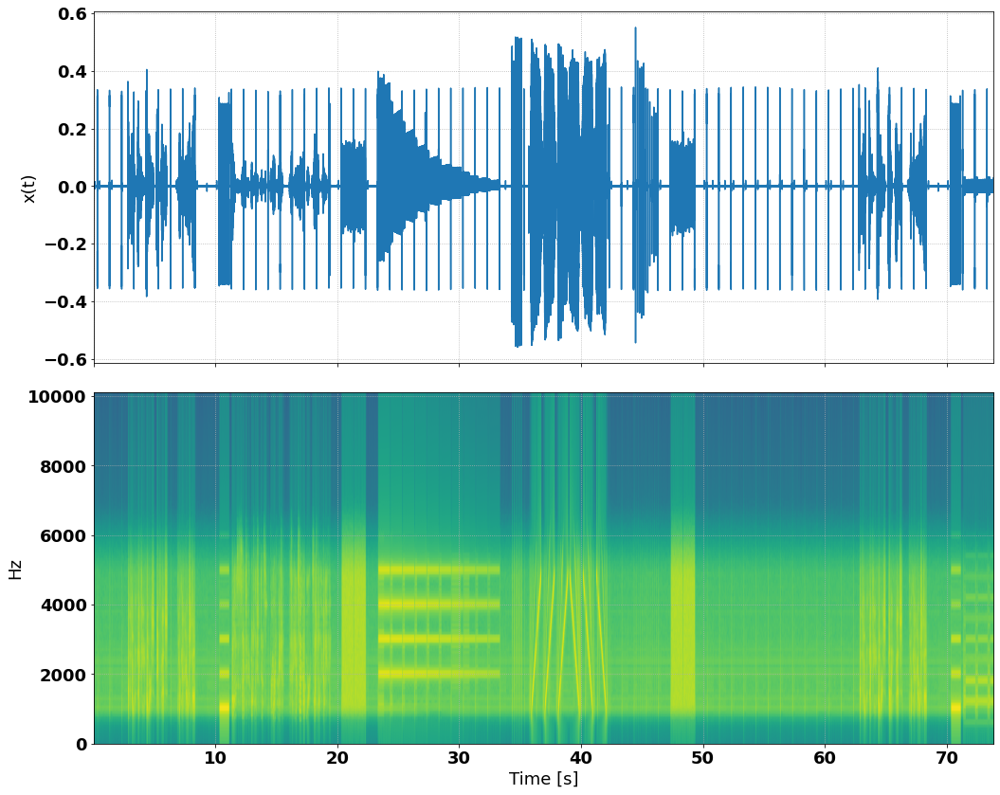

In [43]:
wav1_filt_chirps = signal.filtfilt(b_chirps, a_chirps, wav1_offset)
plot_signal(t_wav1, wav1_filt_chirps)

## Cross-Correlate and Find the Timing

In [44]:
# Collected Signal from start of the first white noise to the start of the second white noise
collected_1, t_collected_1 = extract(wav1_filt_chirps, t1, t1+t2, fs_wav1)

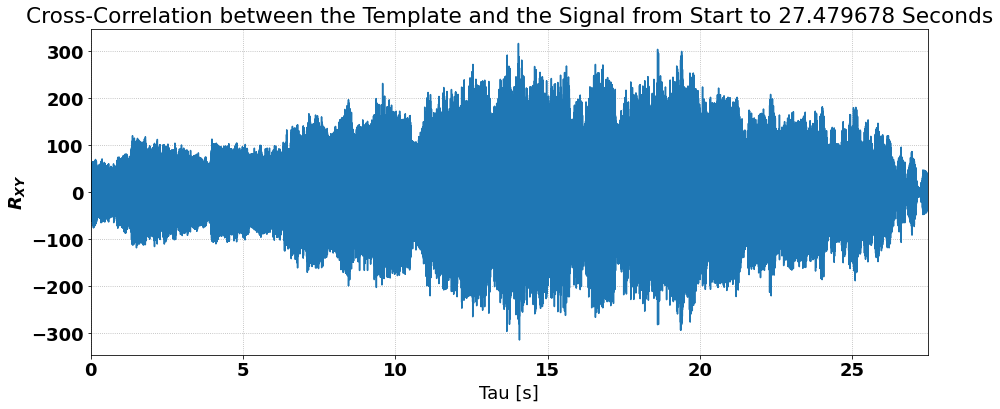

Start Time of the Chirps relative to Start Time of the First Noise: 14.038570 seconds
Start Time of the Chirps relative to the beginning of the recording: 34.737567 seconds


In [45]:
t_chirps = find(chirps, collected_1, fs_wav1)
print("Start Time of the Chirps relative to Start Time of the First Noise: {:f} seconds".format(t_chirps))
print("Start Time of the Chirps relative to the beginning of the recording: {:f} seconds".format(t_chirps + t1))

# Signal to Noise Ratio (SNR)

## Power from Spectrum

In [83]:
# sn = extract(wav1_n, t_chirps+t1+1.4, t_chirps+t1+2.4, fs_wav1)
sn = extract(wav1_n, t_chirps+t1+1.5, t_chirps+t1+2.3, fs_wav1)[0]
N = len(sn)
Fs = fs_wav1

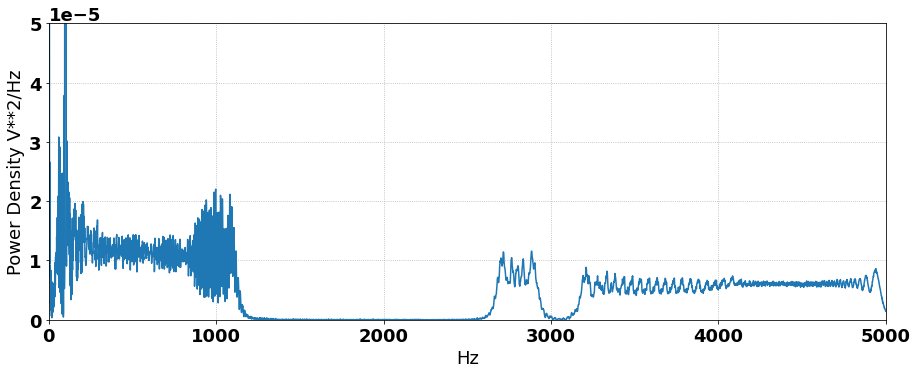

In [84]:
# For notes on the norm keyword, see the "Normalization" section in
# https://numpy.org/doc/stable/reference/routines.fft.html
SNf     = np.fft.fft(sn,norm='ortho')
SNf     = np.fft.fftshift(SNf)
SNf_pwr = (np.abs(SNf)**2)/(N)

f       = np.fft.fftfreq(N,d=1./Fs)
f       = np.fft.fftshift(f)

fig = plt.figure(figsize=(15,12))
ax = fig.add_subplot(2,1,1)
ax.plot(f,SNf_pwr)
plt.ylim(0,0.00005)
plt.xlim(0,5000)
ax.set_ylabel('Power Density V**2/Hz')
ax.set_xlabel('Hz')
plt.show()

In [85]:
samp_bw    = 5000                 # Desired Bandwidth of Sample

df         = f[1]-f[0]
samp_N     = int(samp_bw/df)

In [86]:
s_samp_0     = 0                # Starting Frequency of signal sample bandwidth
s_samp_0_inx = np.argmin(np.abs(f-s_samp_0))
s_samp_1_inx = s_samp_0_inx + samp_N

print('Signal Sample Frequency Range: ',f[s_samp_0_inx], f[s_samp_1_inx])
print('Signal Sample Index Range: ',(s_samp_0_inx,s_samp_1_inx))
print('')

Signal Sample Frequency Range:  0.0 4998.8117167726405
Signal Sample Index Range:  (8099, 12098)



In [87]:
Sf_samp     = SNf[s_samp_0_inx:s_samp_1_inx]
Sf_samp_pwr = np.sum((np.abs(Sf_samp)**2)/len(Sf_samp))

In [88]:
N*1./fs_wav1

0.7999901229690355

In [89]:
sn = extract(wav1_n, t_chirps+t1+9, t_chirps+t1+9+N*(1./fs_wav1), fs_wav1)[0]
N = len(sn)
Fs = fs_wav1

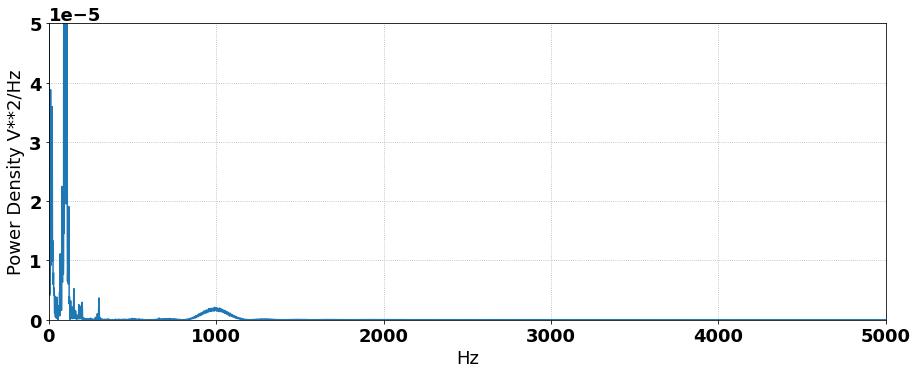

In [90]:
# For notes on the norm keyword, see the "Normalization" section in
# https://numpy.org/doc/stable/reference/routines.fft.html
SNf     = np.fft.fft(sn,norm='ortho')
SNf     = np.fft.fftshift(SNf)
SNf_pwr = (np.abs(SNf)**2)/(N)

f       = np.fft.fftfreq(N,d=1./Fs)
f       = np.fft.fftshift(f)

fig = plt.figure(figsize=(15,12))
ax = fig.add_subplot(2,1,1)
plt.ylim(0,0.00005)
plt.xlim(0,5000)
ax.plot(f,SNf_pwr)
ax.set_ylabel('Power Density V**2/Hz')
ax.set_xlabel('Hz')
plt.show()

In [91]:
n_samp_0     = 0              # Starting Frequency of signal sample bandwidth
n_samp_0_inx = np.argmin(np.abs(f-n_samp_0))
n_samp_1_inx = n_samp_0_inx + samp_N

print('Noise Sample Frequency Range: ',f[n_samp_0_inx], f[n_samp_1_inx])
print('Noise Sample Index Range: ',(n_samp_0_inx,n_samp_1_inx))

Noise Sample Frequency Range:  0.0 4998.8117167726405
Noise Sample Index Range:  (8099, 12098)


In [92]:
Nf_samp     = SNf[n_samp_0_inx:n_samp_1_inx]
Nf_samp_pwr = np.sum((np.abs(Nf_samp)**2)/len(Nf_samp))

In [93]:
SNR_estimate    = ((Sf_samp_pwr-Nf_samp_pwr)/Nf_samp_pwr)
SNR_estimate_dB = 10.*np.log10(SNR_estimate)

print('SNR_estimate: ',SNR_estimate)
print('SNR_estimate_dB: ',SNR_estimate_dB)

SNR_estimate:  -0.3632164540360109
SNR_estimate_dB:  nan


C:\Users\CUONGG~1\AppData\Local\Temp/ipykernel_21240/2574864169.py:2: RuntimeWarning: invalid value encountered in log10
  SNR_estimate_dB = 10.*np.log10(SNR_estimate)
